In [11]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import chart_studio.plotly as py
import cufflinks as cf
import plotly.graph_objects as go
import plotly.express as px
import missingno as msno
from ipywidgets import interact, widgets
from ydata_profiling import ProfileReport
%matplotlib inline 

In [12]:
# Função para carregar CSV e XLS da Pasta:

Quake = pd.read_csv("Z:/01. PESSOAL/BRUNO/VScode/Quake/dataset_2195_quake.csv")


print("Dados de Quake:", Quake.shape)
Quake.info()


Dados de Quake: (2178, 4)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   focal_depth  2178 non-null   int64  
 1   latitude     2178 non-null   float64
 2   longitude    2178 non-null   float64
 3   richter      2178 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 68.2 KB


In [13]:
#Verificando estatisticas descritivas

Quake.describe()

,focal_depth,latitude,longitude,richter
count,2178.000000,2178.000000,2178.000000,2178.000000
mean,74.359963,7.961997,54.914835,5.977181
std,116.467797,30.545583,118.875581,0.189426
min,0.000000,-66.490000,-179.960000,5.800000
25%,21.000000,-12.432500,-67.782500,5.800000
50%,39.000000,0.210000,122.100000,5.900000
75%,68.000000,36.480000,146.860000,6.100000
max,656.000000,78.150000,180.000000,6.900000


In [14]:
#Usando o profile report para verificar o dataframe
Quake.profile_report()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 4/4 [00:00<00:00, 666.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
import folium

# Criar mapa centrado na média das coordenadas
map_center = [Quake['latitude'].mean(), Quake['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=2)

# Adicionar marcadores com cores por magnitude
for idx, row in Quake.iterrows():
    popup_text = f"Mag: {row['richter']}<br>Prof: {row['focal_depth']} km"
    color = 'red' if row['richter'] >= 6.2 else 'orange'
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['richter'] * 2,
        popup=popup_text,
        color=color,
        fill=True
    ).add_to(m)

# Salvar ou exibir o mapa
m.save('earthquakes_map.html')
m

In [16]:
import geopandas as gpd

plates = gpd.read_file('Z:/01. PESSOAL/BRUNO/VScode/Quake/tectonicplates-master/PB2002_plates.shp')

# Converter DataFrame de terremotos para GeoDataFrame
gdf = gpd.GeoDataFrame(
    Quake,
    geometry=gpd.points_from_xy(Quake['longitude'], Quake['latitude']),
    crs="EPSG:4326"  # Sistema de coordenadas WGS84
)

# Verificar a qual placa cada ponto pertence (usando 'join'espacial)
terremotos_com_placas = gpd.sjoin(gdf, plates, how='left')

# Mostrar resultados
print(terremotos_com_placas[['latitude', 'longitude', 'richter', 'PlateName']])

      latitude  longitude  richter       PlateName
0       -52.26      28.30      6.7          Africa
1        45.53     150.93      5.8         Okhotsk
2        41.85     142.78      5.8         Okhotsk
3        29.19     141.15      6.2  Philippine Sea
4       -21.66     169.81      6.0    New Hebrides
...        ...        ...      ...             ...
2173     51.54    -173.11      5.8   North America
2174    -10.16     161.01      5.9         Pacific
2175     27.87     139.51      5.8  Philippine Sea
2176     36.43     140.98      6.0         Okhotsk
2177     24.02     122.23      5.8         Okinawa

[2178 rows x 4 columns]


In [17]:
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd

plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")
# 1. Criar mapa base
map_center = [Quake['latitude'].mean(), Quake['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=2, tiles='CartoDB dark_matter')

# 2. Adicionar camada das placas tectônicas (linhas amarelas)
plates_geojson = plates.__geo_interface__
folium.GeoJson(
    plates_geojson,
    name='Placas Tectônicas',
    style_function=lambda x: {'color': 'yellow', 'weight': 1.5, 'opacity': 0.7}
).add_to(m)

# 3. Criar um cluster de marcadores para os terremotos
marker_cluster = MarkerCluster(
    name="Terremotos",
    control=True,
    options={
        'maxClusterRadius': 20,  # Ajuste para agrupar mais ou menos
        'disableClusteringAtZoom': 6  # Desativa clustering em zoom alto
    }
).add_to(m)

# 4. Adicionar terremotos ao cluster (com popup personalizado)
for idx, row in Quake.iterrows():
    # Definir cor baseada na magnitude
    if row['richter'] >= 7:
        color = 'red'
        icon_size = (20, 20)  # Tamanho do ícone para eventos fortes
    elif row['richter'] >= 6.0:
        color = 'orange'
        icon_size = (15, 15)
    else:
        color = 'lightgray'
        icon_size = (10, 10)
    
    # Popup com informações detalhadas
    popup_text = f"""
    <b>Magnitude</b>: {row['richter']}<br>
    <b>Profundidade</b>: {row['focal_depth']} km<br>
    <b>Placa</b>: {row.get('PlateName', 'N/A')}
    """
    
    # Adicionar marcador ao cluster
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=folium.Popup(popup_text, max_width=250),
        icon=folium.Icon(
            color=color,
            icon='bullseye',  # Ícone de alvo (pode ser alterado)
            prefix='fa'  # Usa FontAwesome (opcional)
        )
    ).add_to(marker_cluster)

# 5. Adicionar controle de camadas e título
folium.LayerControl().add_to(m)
m.add_child(folium.Element("<h3 align='center' style='font-family:Arial'>Terremotos e Placas Tectônicas</h3>"))

# Salvar e exibir
m.save('terremotos_cluster.html')
m
m

tipo_evento
leve        1209
moderado     969
forte          0
Name: count, dtype: int64


C:\Users\bruno\AppData\Local\Temp\ipykernel_15700\2455504669.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




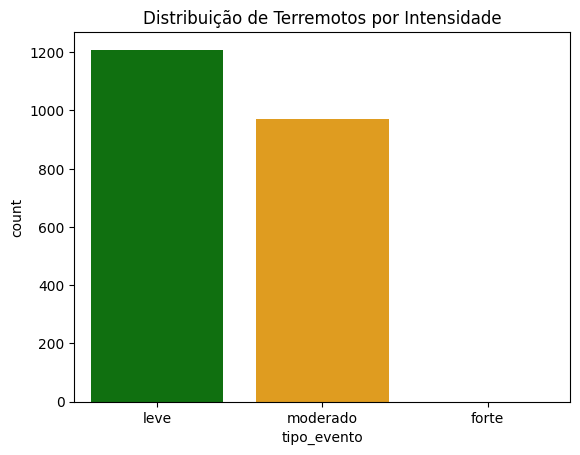

In [18]:
# Criar coluna de categoria
Quake['tipo_evento'] = pd.cut(
    Quake['richter'],
    bins=[0, 5.9, 6.9, 10],
    labels=['leve', 'moderado', 'forte']
)

# Contar eventos por tipo
print(Quake['tipo_evento'].value_counts())

# Opcional: Visualização
sns.countplot(x='tipo_evento', data=Quake, palette=['green', 'orange', 'red'])
plt.title('Distribuição de Terremotos por Intensidade')
plt.show()

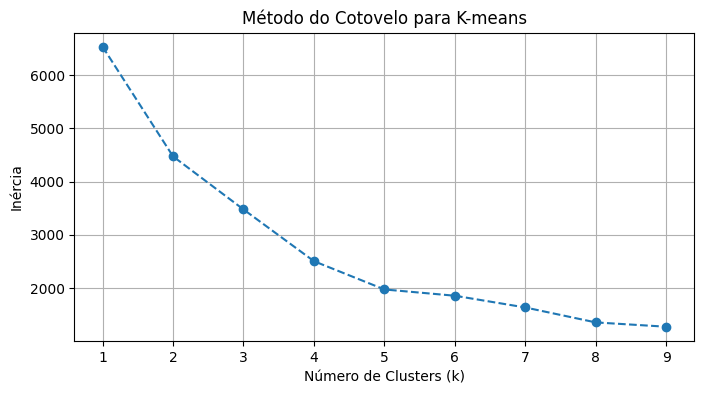

In [20]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Selecionar features para clusterização
X = Quake[['latitude', 'longitude', 'richter']]

# Padronizar os dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# Calcular inércia para diferentes valores de k
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plotar método do cotovelo
plt.figure(figsize=(8, 4))
plt.plot(range(1, 10), inertia, marker='o', linestyle='--')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inércia')
plt.title('Método do Cotovelo para K-means')
plt.grid(True)
plt.show()

In [40]:
from sklearn.metrics import silhouette_score
for k in range(2, 7):
    kmeans = KMeans(n_clusters=k).fit(X_scaled)
    score = silhouette_score(X_scaled, kmeans.labels_)
    print(f"k={k}: Silhouette Score = {score:.2f}")

k=2: Silhouette Score = 0.29
k=3: Silhouette Score = 0.34
k=4: Silhouette Score = 0.37
k=5: Silhouette Score = 0.40
k=6: Silhouette Score = 0.41


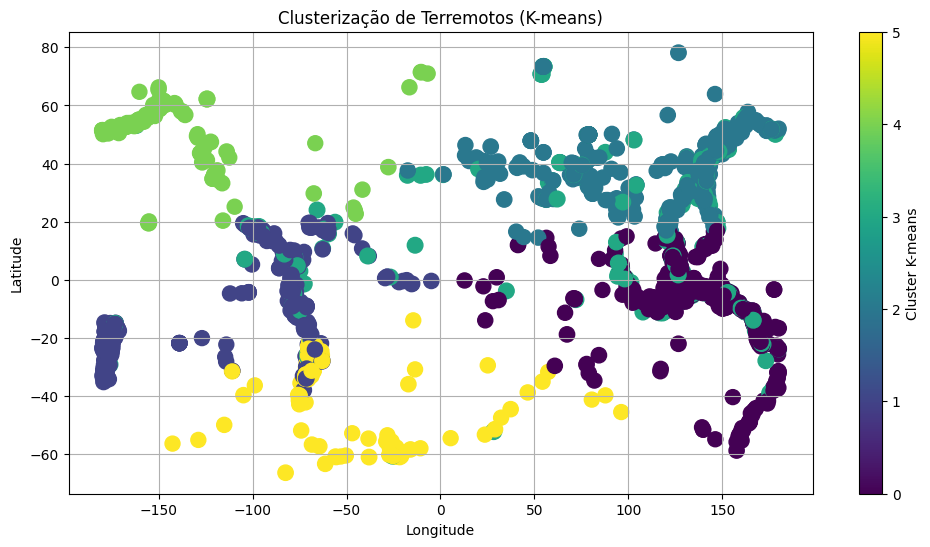

In [43]:
# Clusterização com k=6
kmeans = KMeans(n_clusters=6, random_state=42)
Quake['cluster_kmeans'] = kmeans.fit_predict(X_scaled)

# Visualizar clusters em um mapa
plt.figure(figsize=(12, 6))
plt.scatter(Quake['longitude'], Quake['latitude'], c=Quake['cluster_kmeans'], cmap='viridis', s=Quake['richter']*20)
plt.colorbar(label='Cluster K-means')
plt.title('Clusterização de Terremotos (K-means)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

In [44]:
Quake.groupby('cluster_kmeans')[['richter', 'focal_depth']].describe()


richter                                                 \
                 count      mean       std  min  25%   50%   75%  max   
cluster_kmeans                                                          
0                716.0  5.904749  0.105670  5.8  5.8  5.90  6.00  6.2   
1                350.0  5.951429  0.145164  5.8  5.8  5.90  6.00  6.4   
2                546.0  5.917399  0.108406  5.8  5.8  5.90  6.00  6.2   
3                297.0  6.334680  0.143706  6.1  6.2  6.30  6.40  6.9   
4                138.0  5.968841  0.160201  5.8  5.8  5.95  6.10  6.4   
5                131.0  5.889313  0.118485  5.8  5.8  5.80  5.95  6.3   

               focal_depth                                                    \
                     count        mean         std  min    25%   50%     75%   
cluster_kmeans                                                                 
0                    716.0   78.546089  106.891262  0.0  30.00  45.0   78.25   
1                    350.0  106.108571  155.975072  0.0  25.25  43.0  102.50   
2                    546.0   63.787546  112.391022  0.0  10.00  34.0   51.00   
3                    297.0   70.360269  107.530518  0.0  21.00  40.0   73.00   
4                    138.0   27.202899   24.127145  0.0  10.00  24.5   41.00   
5                    131.0   69.465649  115.782242  0.0  26.50  34.0   56.50   

                       
                  max  
cluster_kmeans         
0               635.0  
1               647.0  
2               607.0  
3               656.0  
4               161.0  
5               599.0